# PROJEKAT IZ DUBOKOG UCENJA

## 1. Opis problema i prikaz dataset-a

Naš projekat predstavlja **problem klasifikacije slika leptira i moljaca**. **Dataset** koji smo odabrali ([*'100 butterfly moth species'*](https://www.kaggle.com/datasets/gpiosenka/butterfly-images40-species)) sadrži preko 13500 slika raznih vrsta leptira i moljaca. Sve slike iz skupa su dimenzije 224x224 piksela i u RGB formatu. U ovom dataset-u je predstavljeno 100 vrsta insekata, tj. naš problem klasifikacije će imati **100 klasa**. Sledi prikaz jednog primera iz svake klase:

In [181]:
# Ignorise Tensorflow upozorenja
import warnings
warnings.filterwarnings("ignore")

# Importovanje potrebnih biblioteka
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from keras.utils import image_dataset_from_directory
from keras import layers
from keras.models import Sequential, load_model
from keras.optimizers.legacy import Adam
from keras.losses import SparseCategoricalCrossentropy 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from keras.callbacks import EarlyStopping

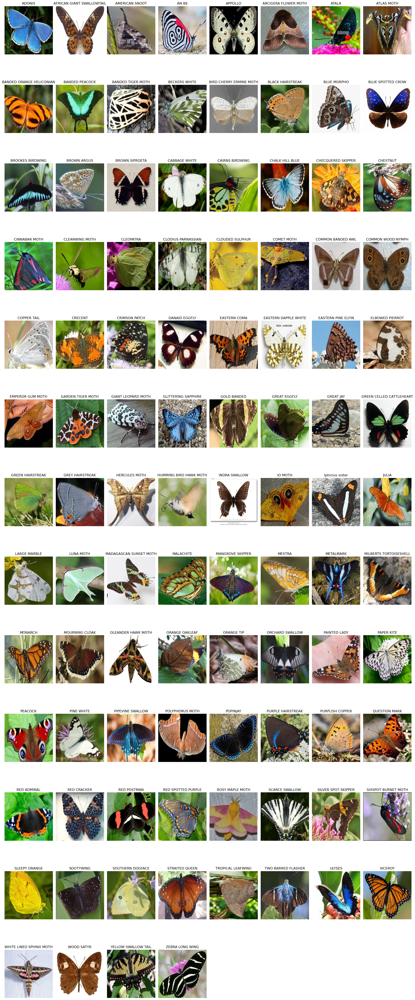

In [174]:
# Prikazivanje jednog odbirka iz svake klase

# Putanja do direktorijuma sa folderima klasa
dataset_dir = '100_butterfly_moth_species/train/'

# Lista svih klasa (foldera) u direktorijumu
classes = os.listdir(dataset_dir)

# Broj kolona u grafiku
num_cols = 8
num_rows = (len(classes) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 50))
axes = axes.flatten()
for i, class_name in enumerate(classes):
    class_path = os.path.join(dataset_dir, class_name)
    image_file = os.listdir(class_path)[0] # Prva slika u direktorijumu za tu klasu
    image_path = os.path.join(class_path, image_file)
    image = Image.open(image_path)
    axes[i].imshow(image)
    axes[i].set_title(class_name)
    axes[i].axis('off')

# Uklanja nepopunjene subplot-ove
for j in range(len(classes), num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## 2. Balansiranost klasa

Sada ćemo prikazati broj slika po klasi. Iako su skupovi u našem dataset-u već podeljeni, mi ćemo prikazati sabrano koliko ima slika po klasi kroz sva tri skupa. 

**Zaključak:** Klase su **dobro balansirane**. Određene klase imaju malo više odbiraka, ali ovo možemo zanemariti i smatrati da sve klase imaju približan broj odbiraka.

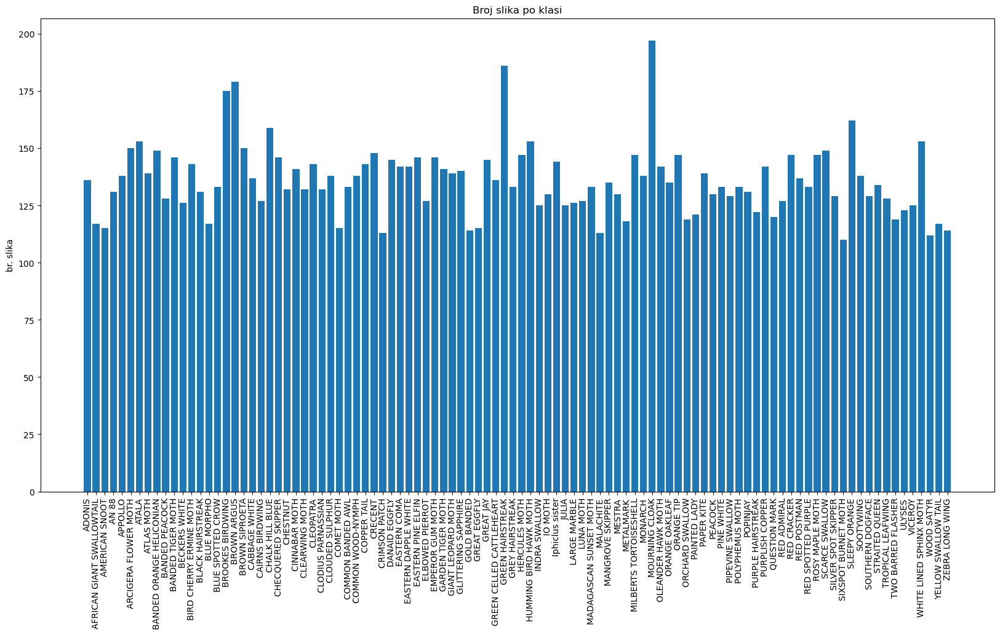

In [177]:
# Prikaz odbiraka po klasama

# Direktorijum sa dataset-om
dataset_dir = '100_butterfly_moth_species'

# Recnik u kome cemo cuvati br slika po klasi
class_counts = {}
    
# Za svaku klasu odredjujemo broj slika u podfolderima
for class_name in classes:
    class_train_path = os.path.join(train_path, class_name)
    class_valid_path = os.path.join(valid_path, class_name)
    class_test_path = os.path.join(test_path, class_name)
    num_images = len(os.listdir(class_train_path)) + len(os.listdir(class_valid_path)) + len(os.listdir(class_test_path))
    class_counts[class_name] = num_images

# Prikaz histograma
plt.figure(figsize=(20, 10))
plt.bar(class_counts.keys(), class_counts.values());
plt.ylabel('br. slika');
plt.title('Broj slika po klasi');
plt.xticks(rotation=90);

## 3. Podela podataka na odgovarajuće skupove

Pri obučavanju neuralnih mreža, skup podataka se obavezno mora **podeliti** na:
- skup za obučavanje,
- skup za validaciju i
- skup za testiranje.

Podela na skupove sprečava pojavu **preobučavanja**. Takođe nam omogućava da istreniramo našu mrežu da ima sposobnost **generalizacije**. Skupove za validaciju i testiranje nikako ne treba koristiti za obučavanje, već samo za proveru već delom obučene ili u potpunosti obučene mreže. Što se tiče raspodele slika kroz skupove, najčešće se vrše podele 60/20/20 ili 80/10/10. Pošto je naš skup podataka izuzetno veliki, validacioni i test skup će imati još manji procenat slika.

Dataset koji smo mi odabrali je **već podeljen** na odgovarajuće skupove:
- za obucavanje (~12500 slika), 
- za validaciju (~500 slika) i
- za testiranje (~500 slika).

## 4. Pretprocesiranje podataka

Za potrebe ovog problema, nismo morali da vršimo puno modifikacija nad originalnim slikama. Izvršili smo sledeće operacije nad ulazima:
- **Skaliranje:** Slike smo smanjili da budu dimenzija 90x90 piksela. Veća dimenzija slike znači da će biti potreban znatno veći broj parametara u mreži. Pošto naš problem ima veliki broj klasa i da bismo smanjili vreme potrebno za obučavanje, manja dimenzija početne slike se pokazalo kao odlično rešenje. Obučavanjem na raznim veličinama slike, ovako odabrana dimenzija ulazne slike je davala najbolji rezultat.
- **Augmentacija** ulazne slike: Kao **ulazni sloj** u mrežu smo dodali da se ulazne slike na razne načine modifikuju. Ovim postižemo veću generalizaciju modela. Od modifikacija nad ulaznom slikom smo uradili sledeće:
    - Nasumično okretanje slike
    - Nasumična rotacija
    - Nasumično zumiranje na sliku
- **Reskaliranje/Normalizacija**: Kao **drugi sloj** mreže smo ubacili reskaliranje, čime se intenziteti piksela ulaznih slika normalizuju.

In [66]:
# Ucitavanje dataset-a

# Putanje do skupova za treniranje, validaciju i testiranje
train_path = '100_butterfly_moth_species/train/'
valid_path = '100_butterfly_moth_species/valid/'
test_path = '100_butterfly_moth_species/test/'

# Parametri za podesavanje
batch_size = 64
image_dim = 90
image_size = (image_dim, image_dim)

# Ucitavanje skupova
train_dataset = image_dataset_from_directory(train_path, batch_size=batch_size, image_size=image_size, shuffle=True, seed=42)
valid_dataset = image_dataset_from_directory(valid_path, batch_size=batch_size, image_size=image_size, shuffle=False, seed=42)
test_dataset = image_dataset_from_directory(test_path, batch_size=batch_size, image_size=image_size, shuffle=False, seed=42)

Found 12594 files belonging to 100 classes.
Found 500 files belonging to 100 classes.
Found 500 files belonging to 100 classes.


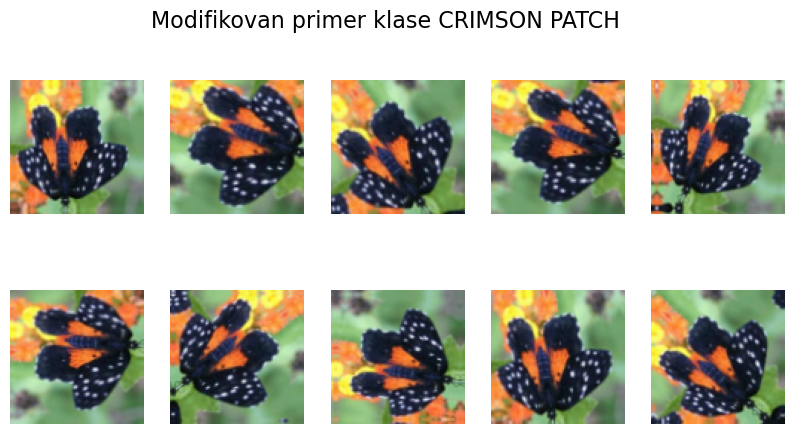

In [178]:
# Augmentacija ulaznih podataka
data_augmentation = Sequential(
  [
    layers.RandomFlip("horizontal", input_shape=(image_size[0], image_size[1], 3)),
    layers.RandomRotation(0.25),
    layers.RandomZoom(0.1),
  ]
)

# Prikaz modifikovane slike
N = 10
plt.figure(figsize=(10,5))
for img, lab in train_dataset.take(1):
    plt.suptitle(f'Modifikovan primer klase {class_names[lab[0]]}', fontsize=16)
    for i in range(N):
        aug_img = data_augmentation(img)
        plt.subplot(2, int(N/2), i+1)
        plt.imshow(aug_img[0].numpy().astype('uint8'))
        plt.axis('off')
        
# Sakriva upozorenja
warnings.filterwarnings("ignore", category=DeprecationWarning)

## 5. Kreiranje modela i obučavanje

Pošto naš problem predstavlja problem klasifikacije više klasa, odabrali smo za kriterijumsku funkciju **SparceCategoricalCrossEntropy**. 

Za aktivacione funkcije smo najčešće koristili **ReLu** aktivacionu funkciju, zato što uvodi dovoljno nelinearnosti u naš model, a računarski se jednostavno realizuje što ubrzava proces obučavanja. Osim nje smo u poslednjem sloju mreže koristili **SoftMax** aktivacionu funkciju, koja ima funkciju da klasifikuje na više klasa.

Sledi opis arhitekture mreže po slojevima:
- **Augmentacioni sloj**: Opisali smo ga kao korak u pretprocesiranju podataka
- **Reskaliranje**: Takođe predstavlja korak pretprocesiranja podataka
- **Konvolucioni slojevi**: Odabrali smo da naša mreža ima **3 konvoluciona sloja**, pri čemu nakon svakog Conv sloja primenjujemo **MaxPooling**. Ideja je da prvi konvolucioni sloj vrši najjednostavnije operacije nad ulaznim slikama, pa smo za njega odabrali dimenzije filtra 3x3. Svaki sledeći sloj treba da ima mogućnost dalje detekcije složenijih obrazaca ulazne slike. Zato smo odabrali da 2. i 3. sloj imaju respektivno po filtre dimenzija 4x4 i 5x5. Ova odluka je bila kompromis između složenijeg (sposobnijeg) modela i bržeg obučavanja. Kada bismo odabrali veće filtre u konvolucionim slojevima, imali bismo znatno veći broj parametara mreže, pa bi se vreme obučavanja višestruko povećalo. 
- **FullyConnected slojevi**: Naš model ima 3 ovakva sloja, pri čemu nakon prva dva uvodimo **Dropout** slojeve (sa verovatnoćama odbacivanja od 0.5 i 0.3 respektivno) koji služe za regularizaciju, dok nakon 3. sloja imamo **Softmax** aktivacionu funkciju.

Kao optimizator smo odabrali **ADAM** zato što ovaj optimizator omogućava da se prenebregnu lokalni minimumi u kriterijumskoj funkciji i efikasan je u njenoj minimizaciji.

**Preobučavanje**

Preobučavanje je pojava da se neuralna mreža obuči tako da odlično klasifikuje podatke nad kojim je obučena ali ne radi dobro generalizaciju nad podacima van trening skupa. Ovakva mreža neće dobro klasifikovati podatke koje su van njenog trening skupa. Da bi se sprečila ova pojava, uvode se tehnike koje omogućavaju generalizaciju neuralne mreže. Ovih tehnika ima dosta, a one koje smo mi primenili su sledeće:
- **Pretprocesiranje**: U prvom sloju naše mreže smo uveli augmentaciju. Ovaj sloj ima ulogu da učini ulazne podatke raznovrsnijim, čime se poboljšava generalizacija i otklanja preobučavanje.
- **Dropout slojevi**: Nakon svakog FC sloja smo dodali da se određen procenat odbiraka odbacuje. Na ovaj način se povećava nasumičnost mreže i omogućava bolja generalizacija.
- **Early Stopping**: Ova tehnika se primenjuje u toku obučavanja. Za potrebe ove metode se koristi validacioni skup podataka. Tehnika funkcioniše tako što se prati kriterijumska funkcija nad trening skupom ali i nad validacionim skupom, koji ne ulazi u proces obučavanja. Ukoliko validaciona kriva počne da raste dok trening kriva nastavlja da opada, ustupilo je preobučavanje i tada možemo da prestanemo sa procesom jer će na dalje mreža samo da postane gora u generalizovanju.

In [179]:
# Uklanja upozorenja
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Broj klasa
num_classes = len(class_names)

model = Sequential([
    # 1. sloj: Augmentacija
    data_augmentation,
    
    # 2. sloj: Reskaliranje (Normalizacija)
    layers.Rescaling(1./255, input_shape=(image_dim, image_dim, 3)),
    
    # Konvolucioni slojevi
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    
    layers.Conv2D(64, 4, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    
    layers.Conv2D(128, 5, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    
    layers.Flatten(),
    
    # FC slojevi
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    
    # Izlazni sloj
    layers.Dense(num_classes, activation='softmax')
])

model.summary()

model.compile(Adam(learning_rate=0.001), loss=SparseCategoricalCrossentropy(), metrics='accuracy')

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_8 (Sequential)   (None, 90, 90, 3)         0         
                                                                 
 rescaling_4 (Rescaling)     (None, 90, 90, 3)         0         
                                                                 
 conv2d_12 (Conv2D)          (None, 90, 90, 32)        896       
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 45, 45, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_13 (Conv2D)          (None, 45, 45, 64)        32832     
                                                                 
 max_pooling2d_13 (MaxPooli  (None, 22, 22, 64)        0         
 ng2D)                                                

In [79]:
# Uklanja upozorenja
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Early stopping za regularizaciju
early_cb = EarlyStopping(monitor='val_loss', mode='min', patience=15, verbose=1, restore_best_weights=True)

# Obucavanje
history = model.fit(train_dataset,
                    epochs=100,
                    validation_data=valid_dataset,
                    callbacks=[early_cb],
                    verbose=1)

Epoch 1/100
197/197 [==============================] - 73s 372ms/step - loss: 4.3358 - accuracy: 0.0372 - val_loss: 3.7698 - val_accuracy: 0.0880
Epoch 2/100
197/197 [==============================] - 75s 377ms/step - loss: 3.7006 - accuracy: 0.1016 - val_loss: 3.4030 - val_accuracy: 0.1520
Epoch 3/100
197/197 [==============================] - 75s 378ms/step - loss: 3.2253 - accuracy: 0.1724 - val_loss: 2.7765 - val_accuracy: 0.2700
Epoch 4/100
197/197 [==============================] - 78s 397ms/step - loss: 2.9138 - accuracy: 0.2271 - val_loss: 2.6178 - val_accuracy: 0.3280
Epoch 5/100
197/197 [==============================] - 74s 375ms/step - loss: 2.6893 - accuracy: 0.2763 - val_loss: 2.4411 - val_accuracy: 0.3620
Epoch 6/100
197/197 [==============================] - 75s 378ms/step - loss: 2.4923 - accuracy: 0.3213 - val_loss: 2.6868 - val_accuracy: 0.3440
Epoch 7/100
197/197 [==============================] - 74s 375ms/step - loss: 2.3664 - accuracy: 0.3519 - val_loss: 1.8927 -

In [187]:
# Cuvanje keras modela
# model.save('model.keras')

# Ucitavanje keras modela
model = load_model('model.keras')

# Cuvanje istorije obucavanja   
# hist_df = pd.DataFrame(history.history) 
# hist_csv_file = 'history.csv'
# with open(hist_csv_file, mode='w') as f:
#     hist_df.to_csv(f)

# Ucitavanje istorije obucavanja

## 6. Rezultati obučavanja

Tačnost našeg modela nad test skupom je 81.6%. U nastavku slede prikazi grafika performansi tokom obučavanja, prikaz matrice konfuzije i prikaz primera dobro i loše klasifikovanih slika iz test skupa.

**Napomena:** Prilikom nalaženja matrice konfuzije, morali smo da je grupišemo, jer je originalna matrica dimenzija 100x100. Spajanjem elemenata smo je smanjili na dimenzije 20x20. 

In [188]:
labels = np.array([])
pred = np.array([])
for img, lab in test_dataset:
    labels = np.append(labels, lab)
    pred = np.append(pred, np.argmax(model.predict(img, verbose=0), axis=1))  

print('Tačnost modela je: ' + str(100*accuracy_score(labels, pred)) + '%')

Tačnost modela je: 81.6%


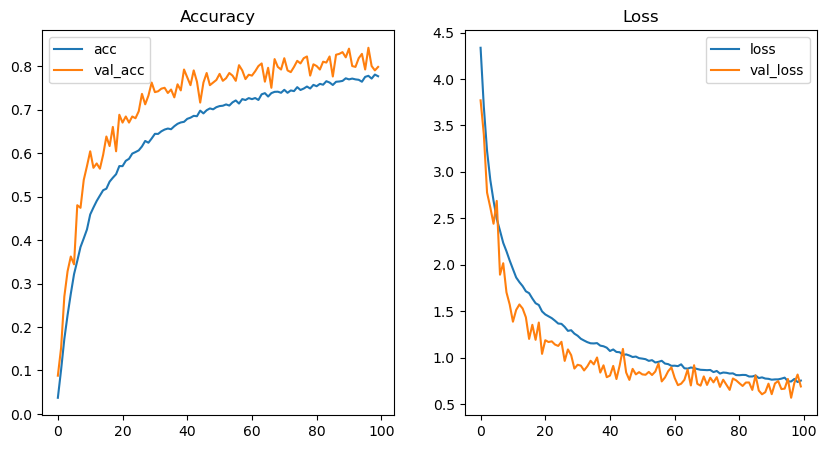

In [190]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Prikaz grafika
plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(acc, label='acc')
plt.plot(val_acc, label='val_acc')
plt.title('Accuracy')
plt.legend()
plt.subplot(122)
plt.plot(loss, label='loss')
plt.plot(val_loss, label='val_loss')
plt.title('Loss')
plt.legend()
plt.show()

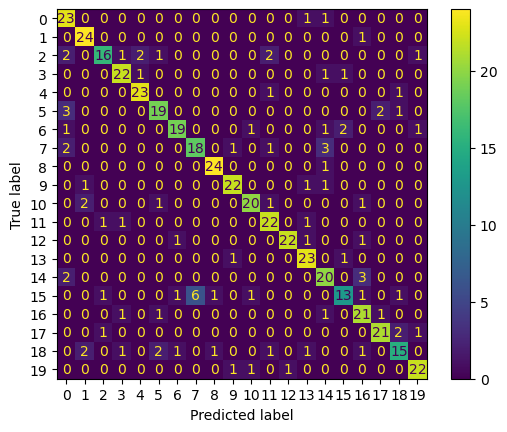

In [189]:
# Konfuziona matrica 100x100
cm = confusion_matrix(labels, pred)

def aggregate_confusion_matrix(cm, aggregation_size):
    num_classes = cm.shape[0]
    aggregated_size = num_classes // aggregation_size
    aggregated_cm = np.zeros((aggregated_size, aggregated_size))

    for i in range(aggregated_size):
        for j in range(aggregated_size):
            aggregated_cm[i, j] = np.sum(
                cm[i * aggregation_size : (i + 1) * aggregation_size, j * aggregation_size : (j + 1) * aggregation_size]
            )

    return aggregated_cm

# Faktor skupljanja konfuzione matrice
aggregation_size = 5  
aggregated_cm = aggregate_confusion_matrix(cm, aggregation_size)

# Prikaz konfuzione matrice
disp = ConfusionMatrixDisplay(confusion_matrix=aggregated_cm)
disp.plot();

16/16 [==============================] - 1s 41ms/step


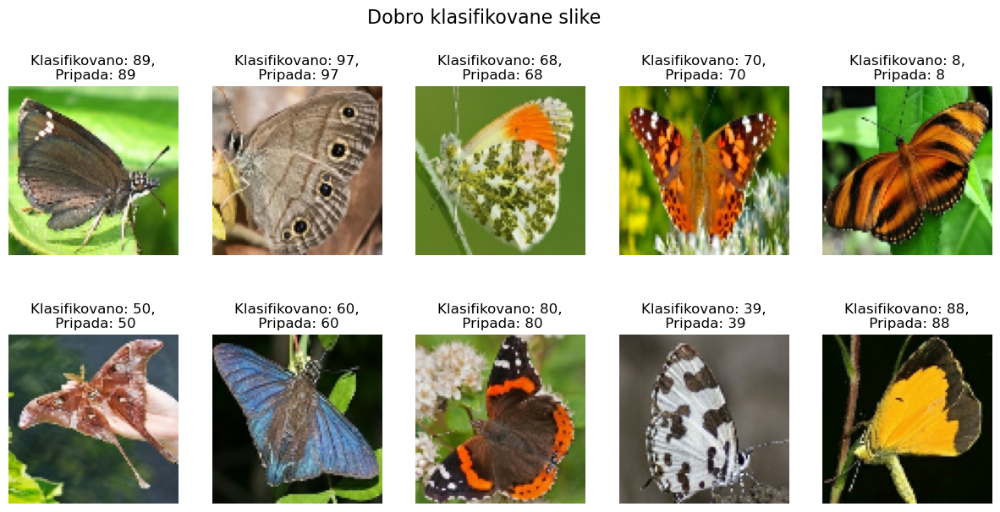

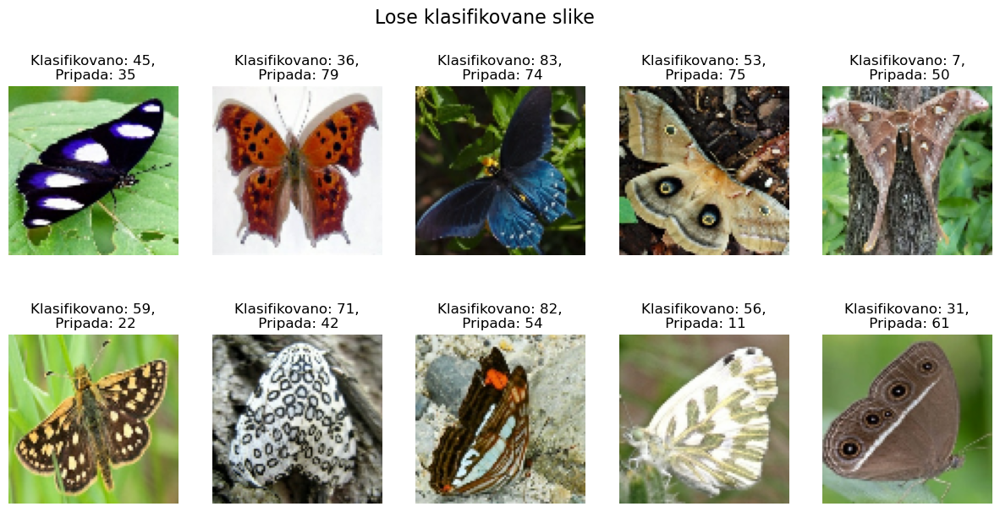

In [191]:
# Liste slika iz test skupa i njihovih labela 
test_images = []
test_labels = []

for images_batch, labels_batch in test_dataset:
    for image, label in zip(images_batch, labels_batch):
        # Dodavanje slike u listu
        if image.shape[0] == 90 and image.shape[1] == 90 and image.shape[2] == 3:
            test_images.append(image)
            test_labels.append(label.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Predikcija
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Dobro klasifikovani leptiri
correct_indices = np.where(predicted_labels == test_labels)[0]

# Lose klasifikovani leptiri
incorrect_indices = np.where(predicted_labels != test_labels)[0]

# Ovo je potrebno da bi slike bile odgovarajuceg formata za prikaz
for i in range(test_images.shape[0]):
    image = test_images[i]
    image = np.asarray(image)
    image = image.astype(np.float32) / 255.0
    test_images[i] = image
    
# Prikaz 10 nasumicnih dobro klasifikovanih slika iz test skupa
random_indices = np.random.choice(correct_indices, size=10, replace=False)
plt.figure(figsize=(15, 7))
plt.suptitle('Dobro klasifikovane slike', fontsize=16)
for i, idx in enumerate(random_indices):
    plt.subplot(2, 5, i + 1)
    plt.imshow(test_images[idx])
    plt.title(f"Klasifikovano: {predicted_labels[idx]},\n Pripada: {test_labels[idx]}")
    plt.axis('off')
plt.show()

# Prikaz 10 nasumicnih lose klasifikovanih slika iz test skupa
random_indices = np.random.choice(incorrect_indices, size=10, replace=False)
plt.figure(figsize=(15, 7))
plt.suptitle('Lose klasifikovane slike', fontsize=16)
for i, idx in enumerate(random_indices):
    plt.subplot(2, 5, i + 1)
    plt.imshow(test_images[idx])
    plt.title(f"Klasifikovano: {predicted_labels[idx]},\n Pripada: {test_labels[idx]}")
    plt.axis('off')
plt.show()